Mission Objectives:
* Focus on iVar functionality (Flowchart)
    * Trimming: Primers and Quality
    * Consensus generation
    * Variants calling, variant filtering
* It is better to look at iSNVs across all the samples without necessarily answering specific questions
* Treat as a cataloguing exercise that showcase iVar functionality and the type of information a user can gather from iVar’s output
* Identify major iSNVs across samples, categorize into synonymous and non-synonymous
* Plot ALT_FREQ for each gene. Gene can be identified from GFF_FEATURE. (Figure)
* Identify indel iSNVs and their prevalence(Figure)
* Analyze changes in iSNVs across time  to see how they evolve (?)
* Present as a set of analysis methods that complement the iVar tool
* Maybe we can show that we have a conda environment for running the pipeline and we can create a github repo for it. (Figure?)
* PrimalSeq protocol schematic
* Entropy of each position on the genome -> Maybe faceted by location? 

In [1]:
import numpy as np
import pandas as pd
import gffutils
from scipy.stats import entropy
import plotly.express as px
import plotly.graph_objects as go

In [2]:
variant_paths = !find /home/gk/analysis/ -type f -path '*variants*' -name '*.tsv'

In [3]:
released_seqs = !find /home/al/code/covid/HCoV-19-Genomics/ -type f -path '*consensus*' -name '*.fa'

In [4]:
len(variant_paths), len(released_seqs)

(3315, 1075)

In [5]:
released_seqs = [f.split('/')[-1].split('.')[0] for f in released_seqs]
# released_seqs

In [6]:
# variant_paths

In [7]:
variant_paths = [p for p in variant_paths if not ('49idSEARCH0508SAN' in p or '54idSEARCH0513SAN' in p)]

In [8]:
len(variant_paths)

3313

In [9]:
all_variants = pd.concat((pd.read_csv(path, sep='\t').assign(path=path) for path in variant_paths))

In [10]:
column_filter = [col for col in all_variants.columns if ('49idSEARCH0508SAN' in col or '54idSEARCH0513SAN' in col or 'Unnamed' in col)]
all_variants.drop(columns=column_filter, inplace=True)

In [11]:
print(all_variants.shape)

(95781, 20)


In [12]:
all_variants.to_csv("all_variants.csv", index=False)

In [11]:
print(all_variants.shape)

(89467, 20)


In [12]:
all_variants.dropna(subset=['POS', 'ALT_FREQ'], inplace=True)

In [13]:
all_variants['date'] = all_variants['path'].apply(lambda x: '-'.join(x.split('/')[4].split('.')[:3]))

In [14]:
all_variants['date'] = pd.to_datetime(all_variants['date'])

In [15]:
all_variants['date'].max(), all_variants['date'].min()

(Timestamp('2020-09-07 00:00:00'), Timestamp('2020-04-06 00:00:00'))

In [16]:
all_variants['sample_id'] = all_variants['path'].apply(lambda x: x.split('/')[-1].split('_')[0])
print(all_variants['sample_id'].unique().shape)

(2696,)


In [17]:
std_variants = all_variants.loc[(all_variants['sample_id'].str.contains('-')) & (~all_variants['sample_id'].str.contains('id'))]
std_variants['sample_id'] = std_variants['sample_id'].apply(lambda x: ''.join(x.split('-')))
print(std_variants['sample_id'].unique().shape)

(2035,)


<ipython-input-17-75422188254e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  std_variants['sample_id'] = std_variants['sample_id'].apply(lambda x: ''.join(x.split('-')))


In [18]:
nonstd_variants = all_variants.loc[(all_variants['sample_id'].str.contains('id')) & (~all_variants['sample_id'].str.contains('-'))]
nonstd_variants['sample_id'] = nonstd_variants['sample_id'].apply(lambda x: x[4:])
print(nonstd_variants['sample_id'].unique().shape)

(642,)


<ipython-input-18-a29a340e480b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonstd_variants['sample_id'] = nonstd_variants['sample_id'].apply(lambda x: x[4:])


In [19]:
all_variants.shape

(89459, 22)

In [20]:
variants = pd.concat([std_variants, nonstd_variants], axis=0)

In [21]:
# variants['sample_id']

In [22]:
released_seqs = [''.join(s.split('-')) for s in released_seqs]
len(released_seqs)

1075

In [23]:
variants = variants.loc[variants['sample_id'].isin(released_seqs)]
print(variants['sample_id'].unique().shape)

(772,)


In [24]:
print(variants.shape)
print(variants.dropna(subset=['POS', 'ALT_FREQ']).shape)

(23890, 22)
(23890, 22)


In [25]:
freq_filter = ((variants['ALT_FREQ'] <= 0.5) & (variants['ALT_FREQ'] >= 0.03))
variants = variants.loc[freq_filter]
print(variants.shape)
print(variants['sample_id'].unique().shape)

(15352, 22)
(723,)


In [26]:
variants = variants.sort_values('date')

In [27]:
variants.drop_duplicates(subset=['sample_id', 'POS', 'ALT'], keep='last', inplace=True)
print(variants.shape)
print(variants['sample_id'].unique().shape)

(11945, 22)
(723,)


In [28]:
variants['VAR'] = variants['POS'].astype(str) + '-' + variants['ALT']

In [29]:
# variants.loc[(variants['POS']==6696) & (variants['ALT']=='+T')]

In [30]:
# import numpy as np
# variants.loc[variants['ALT_AA'].isna()]

In [31]:
variants['iSNV Type'] = 'unknown'
variants.loc[(variants['REF_AA']!=variants['ALT_AA']) & (~variants['ALT_AA'].isna()), 'iSNV Type'] = 'non-synonymous'
variants.loc[(variants['REF_AA']==variants['ALT_AA']) & (~variants['ALT_AA'].isna()), 'iSNV Type'] = 'synonymous'
variants.loc[(variants['ALT'].str.contains('-')), 'iSNV Type'] = 'deletion'
variants.loc[(variants['ALT'].str.contains('\+')), 'iSNV Type'] = 'insertion'
variants.loc[variants['iSNV Type']=='unknown'].shape

(357, 24)

In [32]:
variants['REGION'].value_counts()

NC_045512.2    11945
Name: REGION, dtype: int64

In [33]:
variants['GFF_FEATURE'].value_counts()

cds-YP_009724389.1    3731
cds-YP_009725295.1    1518
cds-YP_009724390.1    1002
cds-YP_009724397.2     359
cds-YP_009724391.1     298
cds-YP_009724395.1     290
cds-YP_009724396.1     187
cds-YP_009724393.1     160
cds-YP_009725318.1     128
cds-YP_009724392.1      95
cds-YP_009725255.1      55
cds-YP_009724394.1      32
Name: GFF_FEATURE, dtype: int64

In [34]:
fn = gffutils.example_filename('/home/gk/code/hCoV19/db/gff/NC_045512.2.gff3')
print(open(fn).read()) 

##sequence-region NC_045512.2 1 29903
##species https://www.ncbi.nlm.nih.gov/Taxonomy/Browser/wwwtax.cgi?id=2697049
NC_045512.2	RefSeq	region	1	29903	.	+	.	ID=NC_045512.2:1..29903;Dbxref=taxon:2697049;collection-date=Dec-2019;country=China;gb-acronym=SARS-CoV-2;gbkey=Src;genome=genomic;isolate=Wuhan-Hu-1;mol_type=genomic RNA;nat-host=Homo sapiens;old-name=Wuhan seafood market pneumonia virus
NC_045512.2	RefSeq	five_prime_UTR	1	265	.	+	.	ID=id-NC_045512.2:1..265;gbkey=5'UTR
NC_045512.2	RefSeq	gene	266	21555	.	+	.	ID=gene-GU280_gp01;Dbxref=GeneID:43740578;Name=ORF1ab;gbkey=Gene;gene=ORF1ab;gene_biotype=protein_coding;locus_tag=GU280_gp01
NC_045512.2	RefSeq	CDS	266	13468	.	+	0	ID=cds-YP_009724389.1;Parent=gene-GU280_gp01;Dbxref=Genbank:YP_009724389.1,GeneID:43740578;Name=YP_009724389.1;Note=pp1ab%3B translated by -1 ribosomal frameshift;exception=ribosomal slippage;gbkey=CDS;gene=ORF1ab;locus_tag=GU280_gp01;product=ORF1ab polyprotein;protein_id=YP_009724389.1
NC_045512.2	RefSeq	CDS	13468	

In [35]:
db = gffutils.create_db(fn, dbfn='test.db', merge_strategy='merge', force=True)

In [36]:
all_gffs = variants['GFF_FEATURE'].dropna().unique()
gff2gene = {}
for gff in all_gffs:
    if gff:
        gff2gene[gff] = db[gff]['gene'][0]
gff2gene

{'cds-YP_009724390.1': 'S',
 'cds-YP_009724391.1': 'ORF3a',
 'cds-YP_009724392.1': 'E',
 'cds-YP_009724393.1': 'M',
 'cds-YP_009724397.2': 'N',
 'cds-YP_009725255.1': 'ORF10',
 'cds-YP_009725295.1': 'ORF1ab',
 'cds-YP_009724389.1': 'ORF1ab',
 'cds-YP_009724395.1': 'ORF7a',
 'cds-YP_009724396.1': 'ORF8',
 'cds-YP_009725318.1': 'ORF7b',
 'cds-YP_009724394.1': 'ORF6'}

In [37]:
variants['gene'] = variants['GFF_FEATURE'].apply(lambda x: gff2gene.get(x, 'nan'))

In [38]:
variants.groupby('gene').agg(min_pos=('POS', 'min'), max_pos=('POS', 'max')).sort_values('min_pos')

,min_pos,max_pos
gene,,
nan,3,29888
ORF1ab,269,21555
S,21564,25382
ORF3a,25410,26214
E,26247,26471
M,26523,27187
ORF6,27203,27382
ORF7a,27398,27754
ORF7b,27757,27887


In [39]:
var_counts = (variants.groupby(['gene', 'POS', 'ALT', 'iSNV Type'])
              .agg(ref=('REF', 'unique'), alt=('ALT', 'unique'), 
                   ref_aa=('REF_AA', 'unique'), alt_aa=('ALT_AA', 'unique'),
                   avg_freq=('ALT_FREQ', 'mean'),
                   num_samples=('sample_id', 'nunique'))
              .sort_values(['num_samples', 'avg_freq'], ascending=False)
              .reset_index())
print(var_counts.shape)
var_counts.head()

(8872, 10)


,gene,POS,ALT,iSNV Type,ref,alt,ref_aa,alt_aa,avg_freq,num_samples
0,nan,6696,+T,insertion,[C],[+T],[nan],[nan],0.057296,185
1,nan,19983,+T,insertion,[C],[+T],[nan],[nan],0.067981,108
2,nan,11074,+T,insertion,[C],[+T],[nan],[nan],0.065195,105
3,nan,11074,-T,deletion,[C],[-T],[nan],[nan],0.053498,85
4,nan,29051,+A,insertion,[C],[+A],[nan],[nan],0.056173,66


In [40]:
indel_filter = (var_counts['ALT'].str.len()!=2)
var_counts = var_counts.loc[indel_filter]
print(var_counts.shape)
var_counts.head()

(7316, 10)


,gene,POS,ALT,iSNV Type,ref,alt,ref_aa,alt_aa,avg_freq,num_samples
5,ORF1ab,16708,G,non-synonymous,[C],[G],[L],[V],0.076991,48
6,ORF1ab,9502,T,synonymous,[C],[T],[A],[A],0.057524,41
7,ORF1ab,11083,T,non-synonymous,[G],[T],[L],[F],0.102970,25
15,ORF8,28253,T,synonymous,[C],[T],[F],[F],0.152249,12
17,nan,29737,C,unknown,[G],[C],[nan],[nan],0.082673,12


In [41]:
isnv_types = var_counts.groupby('iSNV Type').size().reset_index().rename(columns={0: 'num_samples'})
isnv_types

,iSNV Type,num_samples
0,deletion,658
1,insertion,15
2,non-synonymous,4624
3,synonymous,1763
4,unknown,256


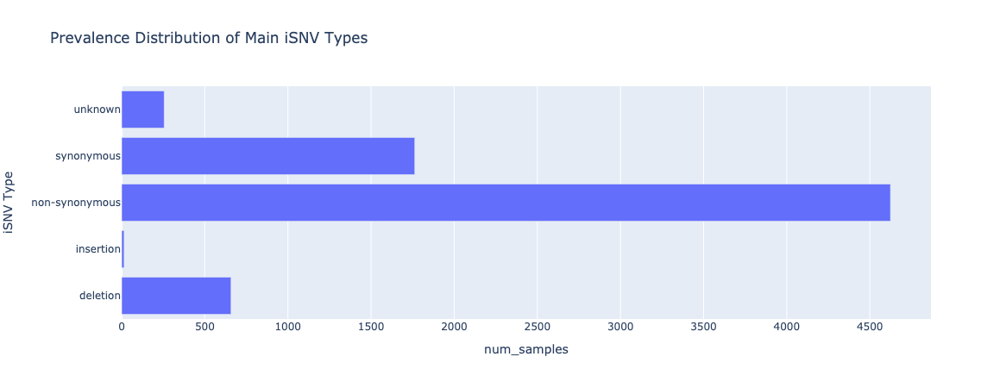

In [43]:
fig = px.bar(isnv_types, y="iSNV Type", x="num_samples",
                 title="Prevalence Distribution of Main iSNV Types")
fig.show()

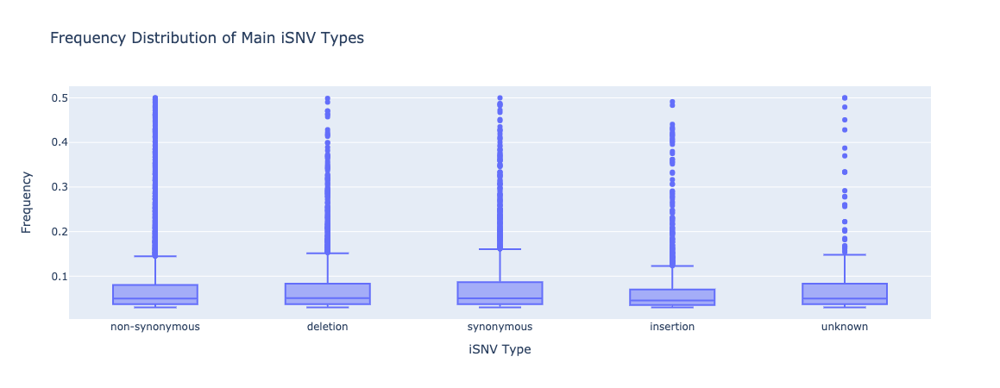

In [44]:
fig = go.Figure(go.Box(y=variants['ALT_FREQ'], x=variants['iSNV Type']))
fig.update_layout(title=f'Frequency Distribution of Main iSNV Types',
              xaxis_title="iSNV Type",
              yaxis_title="Frequency")
fig.show()

In [45]:
# data = [
#     go.Scatter(x = , y=robs, name='Robberies'),

#     go.Scatter(x = yrs, y = emp, name='Empl Rate', 
#                 xaxis='x2') # binding to the second y axis
# ]

# # settings for the new y axis
# x2 = go.XAxis(overlaying='x', side='top')

# # adding the second y axis
# layout = go.Layout(xaxis2=x2)

# fig = go.Figure(data=data, layout=go.Layout(xaxis2=x2))

In [76]:
fig = px.scatter(var_counts, x="POS", y="num_samples", color="iSNV Type", 
                 title="iSNV Prevalence Across Samples Against Position", hover_data=['ref', 'alt', 'ref_aa', 'alt_aa'])
# fig.show()

In [1]:
fig = px.scatter(var_counts, x="avg_freq", y="num_samples", color="iSNV Type", 
                 title="iSNV Prevalence Across Samples Against Frequency", hover_data=['POS', 'ref', 'alt', 'ref_aa', 'alt_aa'])
# fig.show()

NameError: name 'px' is not defined

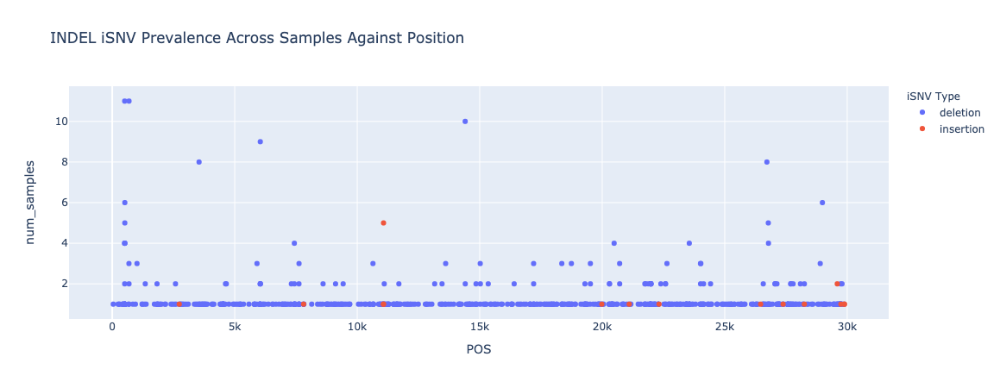

In [48]:
indel_counts = var_counts.loc[(var_counts['iSNV Type']=='insertion') | (var_counts['iSNV Type']=='deletion')]
fig = px.scatter(indel_counts, x="POS", y="num_samples", color="iSNV Type", 
                 title="INDEL iSNV Prevalence Across Samples Against Position", hover_data=['ref', 'alt'])
fig.show()

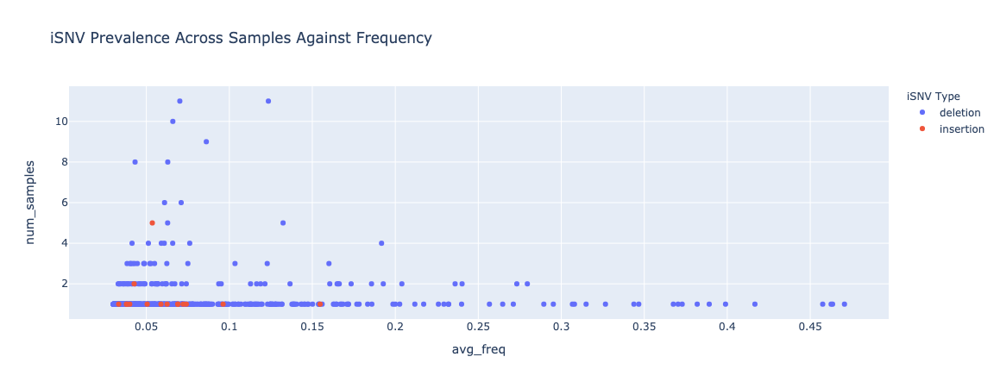

In [49]:
fig = px.scatter(indel_counts, x="avg_freq", y="num_samples", color="iSNV Type", 
                 title="iSNV Prevalence Across Samples Against Frequency", hover_data=['POS', 'ref', 'alt', 'ref_aa', 'alt_aa'])
fig.show()

In [50]:
locs = [x[-3:] for x in released_seqs]
np.unique(locs, return_counts=True)

(array(['01P', '987', 'CS1', 'CS2', 'IPL', 'JOR', 'NBG', 'SAN', 'TIJ'],
       dtype='<U3'),
 array([  1,   1,   8,  33, 122,  28, 123, 720,  39]))

In [51]:
variants['location'] = variants['sample_id'].apply(lambda x: x[-3:])
variants['location'].value_counts()

SAN    9583
NBG    2158
JOR     204
Name: location, dtype: int64

In [52]:
#TODO: Entropy computed on the ALT nucleotides 

In [55]:
indel_filter = (variants['ALT'].str.len()!=2)
tmp = variants.loc[indel_filter]

pos_per_loc = (tmp.groupby(['location', 'POS'])
               .agg(alts=('ALT', 'unique'), alt_cnts=('ALT', pd.Series.value_counts), 
                    isnv_types=('iSNV Type', 'unique'), num_samples=('sample_id', 'nunique'))
               .reset_index()
               .sort_values('num_samples', ascending=False))
pos_per_loc.head()

,location,POS,alts,alt_cnts,isnv_types,num_samples
3531,SAN,9502,[T],41,[synonymous],41
4529,SAN,16708,[G],31,[non-synonymous],31
3772,SAN,11083,[T],19,[non-synonymous],19
931,NBG,16708,[G],16,[non-synonymous],16
1814,SAN,509,"[-GTCATGTTATGGTT, -GTCATGTTA, -GTCATGTT]","[8, 3, 2]",[deletion],13


In [56]:
pos_per_loc['entropy'] = pos_per_loc['alt_cnts'].apply(lambda x: entropy(x))

In [57]:
pos_per_loc[pos_per_loc['POS']==21979]

,location,POS,alts,alt_cnts,isnv_types,num_samples,entropy
5454,SAN,21979,"[-TTT, T, -TT, -TTTTTGGGTG]","[1, 1, 1, 1]","[deletion, synonymous]",4,1.386294


# TODO:
* ignore zero entropy
* change scatter plot to bar chart for better aesthetics
* ditch the location marker

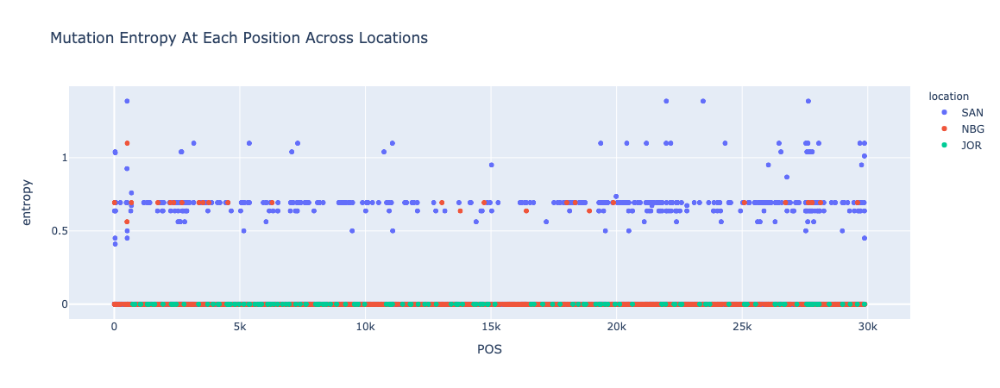

In [58]:
fig = px.scatter(pos_per_loc, x="POS", y="entropy", color="location", hover_data=['alts', 'alt_cnts', 'isnv_types'],
                 title="Mutation Entropy At Each Position Across Locations")
fig.show()

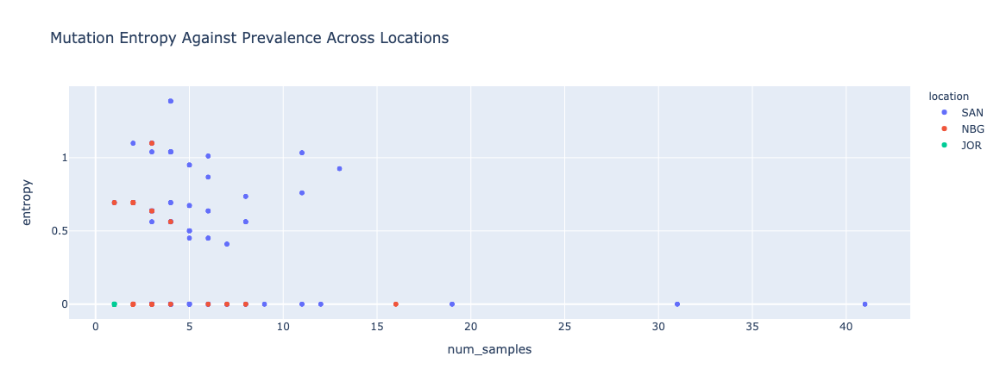

In [59]:
fig = px.scatter(pos_per_loc, x="num_samples", y="entropy", color="location", hover_data=['POS', 'alts', 'alt_cnts', 'isnv_types'],
                 title="Mutation Entropy Against Prevalence Across Locations")
fig.show()

**From the above analysis, we identify the following as positions of interest in the Sars-CoV-2 genome:**
* 6696
* 11074
* 19983
* 16708

In [60]:
meta = pd.read_csv("/home/al/code/covid/HCoV-19-Genomics/metadata.csv")
meta['ID'] = meta['ID'].apply(lambda x: ''.join(x.split('-')))

In [61]:
print(variants['sample_id'].unique().shape)
variants_mrgd = pd.merge(variants, meta, left_on='sample_id', right_on='ID')
print(variants_mrgd['sample_id'].unique().shape)

(723,)
(723,)


In [62]:
variants_mrgd = variants_mrgd.loc[(variants_mrgd['collection_date']!='Unknown') & (variants_mrgd['collection_date']!='1900-01-00') & 
              (~variants_mrgd['collection_date'].str.contains('/'))]
variants_mrgd['collection_date'] = pd.to_datetime(variants_mrgd['collection_date'])

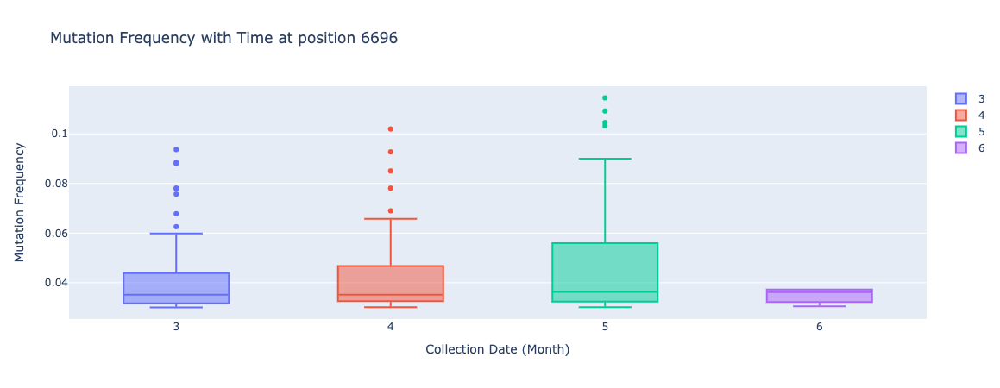

In [63]:
variant_pos = 6696
variant = variants_mrgd.loc[(variant_pos==variants_mrgd['POS'])]
months = sorted(variants_mrgd['collection_date'].dt.month.unique())
fig = go.Figure()
for mnth in months:
    y_i = variant.loc[variant['collection_date'].dt.month == mnth]
    Q1 = y_i['ALT_FREQ'].quantile(0.25)
    Q3 = y_i['ALT_FREQ'].quantile(0.75)
    IQR = Q3 - Q1    #IQR is interquartile range. 
#     print(f'IQR for month {mnth}: {IQR}')
    outlier_filter = (y_i['ALT_FREQ'] >= Q1 - 1.5 * IQR) & (y_i['ALT_FREQ'] <= Q3 + 1.5 *IQR)
    y_i = y_i.loc[outlier_filter]
    fig.add_trace(go.Box(y=y_i['ALT_FREQ'], name=str(mnth)))
fig.update_layout(title=f'Mutation Frequency with Time at position {variant_pos}',
              xaxis_title="Collection Date (Month)",
              yaxis_title="Mutation Frequency")
fig.show()

In [64]:
variants_time = variants_mrgd.groupby(['POS', 'collection_date']).agg(num_samples=('sample_id', 'nunique')).reset_index()

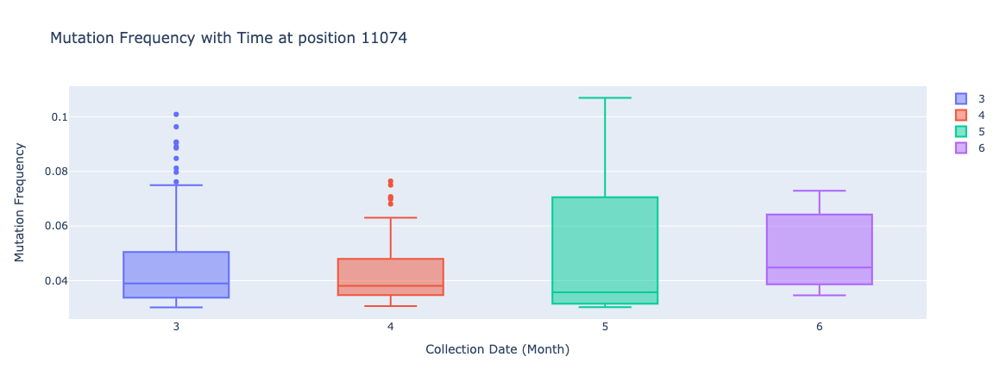

In [65]:
variant_pos = 11074
variant = variants_mrgd.loc[(variant_pos==variants_mrgd['POS'])]
months = sorted(variants_mrgd['collection_date'].dt.month.unique())
fig = go.Figure()
for mnth in months:
    y_i = variant.loc[variant['collection_date'].dt.month == mnth]
    Q1 = y_i['ALT_FREQ'].quantile(0.25)
    Q3 = y_i['ALT_FREQ'].quantile(0.75)
    IQR = Q3 - Q1    #IQR is interquartile range. 
#     print(f'IQR for month {mnth}: {IQR}')
    outlier_filter = (y_i['ALT_FREQ'] >= Q1 - 1.5 * IQR) & (y_i['ALT_FREQ'] <= Q3 + 1.5 *IQR)
    y_i = y_i.loc[outlier_filter]
    fig.add_trace(go.Box(y=y_i['ALT_FREQ'], name=str(mnth)))
fig.update_layout(title=f'Mutation Frequency with Time at position {variant_pos}',
              xaxis_title="Collection Date (Month)",
              yaxis_title="Mutation Frequency")
fig.show()

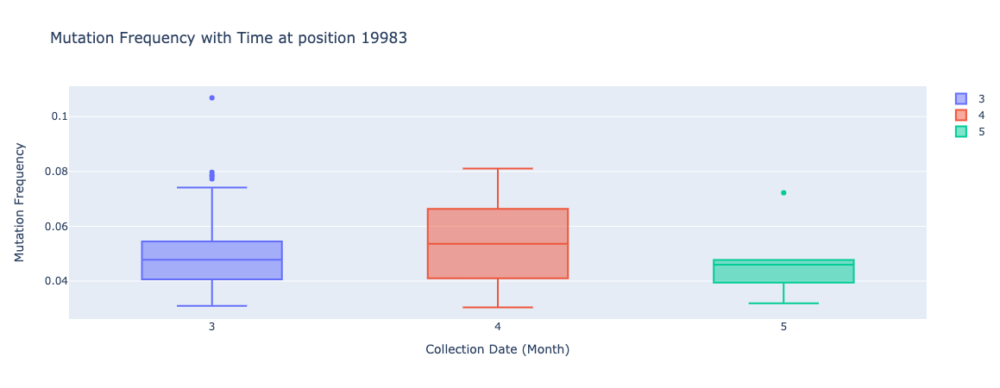

In [66]:
variant_pos = 19983
variant = variants_mrgd.loc[(variant_pos==variants_mrgd['POS'])]
months = sorted(variants_mrgd['collection_date'].dt.month.unique())
fig = go.Figure()
for mnth in months:
    y_i = variant.loc[variant['collection_date'].dt.month == mnth]
    Q1 = y_i['ALT_FREQ'].quantile(0.25)
    Q3 = y_i['ALT_FREQ'].quantile(0.75)
    IQR = Q3 - Q1    #IQR is interquartile range. 
#     print(f'IQR for month {mnth}: {IQR}')
    outlier_filter = (y_i['ALT_FREQ'] >= Q1 - 1.5 * IQR) & (y_i['ALT_FREQ'] <= Q3 + 1.5 *IQR)
    y_i = y_i.loc[outlier_filter]
    fig.add_trace(go.Box(y=y_i['ALT_FREQ'], name=str(mnth)))
fig.update_layout(title=f'Mutation Frequency with Time at position {variant_pos}',
              xaxis_title="Collection Date (Month)",
              yaxis_title="Mutation Frequency")
fig.show()

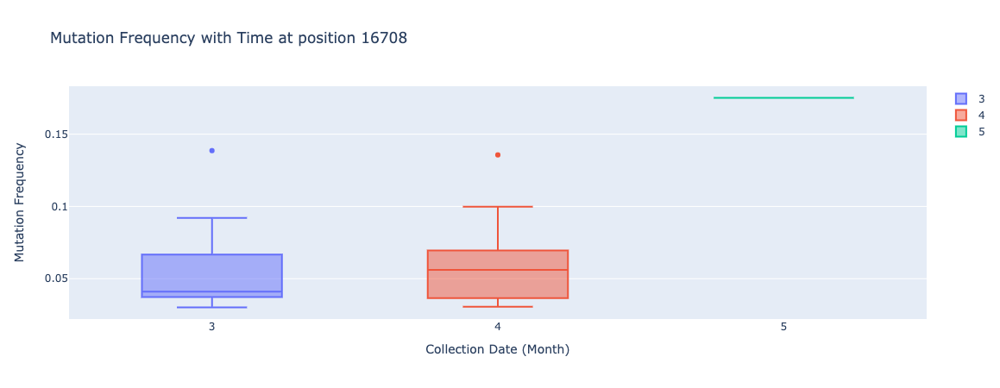

In [67]:
variant_pos = 16708
variant = variants_mrgd.loc[(variant_pos==variants_mrgd['POS'])]
months = sorted(variants_mrgd['collection_date'].dt.month.unique())
fig = go.Figure()
for mnth in months:
    y_i = variant.loc[variant['collection_date'].dt.month == mnth]
    Q1 = y_i['ALT_FREQ'].quantile(0.25)
    Q3 = y_i['ALT_FREQ'].quantile(0.75)
    IQR = Q3 - Q1    #IQR is interquartile range. 
#     print(f'IQR for month {mnth}: {IQR}')
    outlier_filter = (y_i['ALT_FREQ'] >= Q1 - 1.5 * IQR) & (y_i['ALT_FREQ'] <= Q3 + 1.5 *IQR)
    y_i = y_i.loc[outlier_filter]
    fig.add_trace(go.Box(y=y_i['ALT_FREQ'], name=str(mnth)))
fig.update_layout(title=f'Mutation Frequency with Time at position {variant_pos}',
              xaxis_title="Collection Date (Month)",
              yaxis_title="Mutation Frequency")
fig.show()

<ipython-input-68-39d5326bdfd9>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



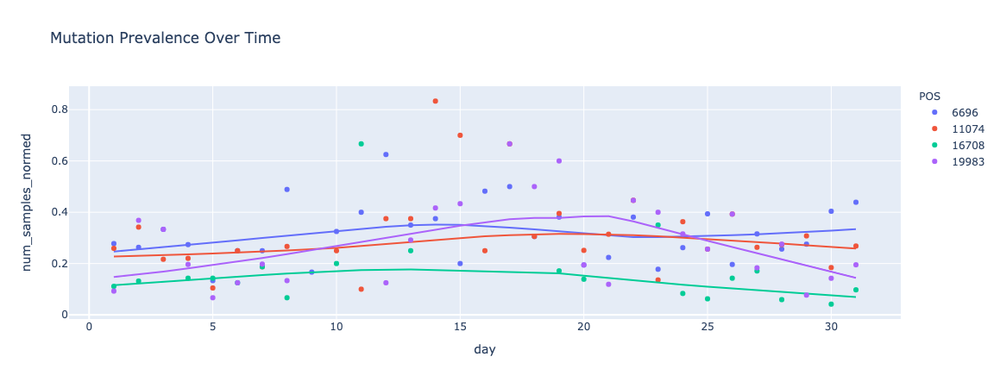

In [68]:
samples_time = variants_mrgd.groupby('collection_date').agg(total_samples=('sample_id', 'nunique')).reset_index()
time_mrgd = pd.merge(variants_time, samples_time, on='collection_date')
time_mrgd['num_samples_normed'] = time_mrgd['num_samples'] / time_mrgd['total_samples']
time_mrgd['day'] = time_mrgd['collection_date'].dt.day
time_mrgd_mnth = time_mrgd.groupby(['day', 'POS']).agg(num_samples_normed=('num_samples_normed', 'mean')).reset_index()
poi = [6696, 11074, 19983, 16708]
data = time_mrgd_mnth.loc[time_mrgd_mnth['POS'].isin(poi)]
data['POS'] = data['POS'].astype(str)
fig = px.scatter(data, x="day", y="num_samples_normed", color="POS", 
                 title="Mutation Prevalence Over Time", trendline='lowess')
fig.show()

## TODO:
* repeat with only non-synonymous
* repeat with insertions
* repeat with deletions

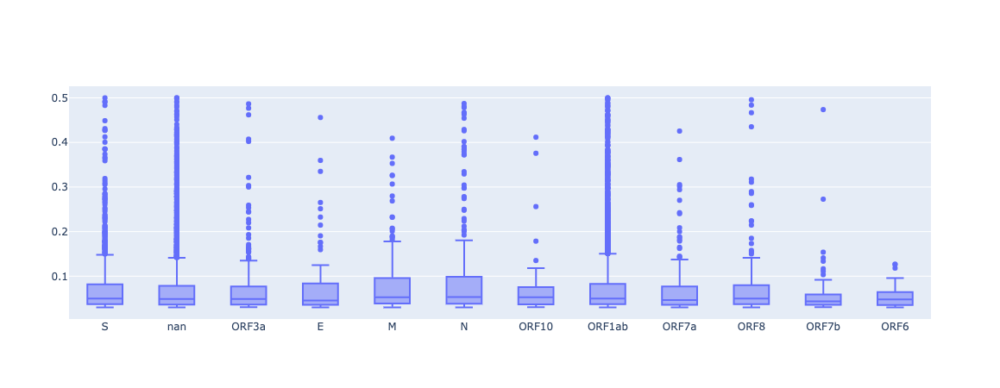

In [69]:
fig = go.Figure(go.Box(y=variants['ALT_FREQ'], x=variants['gene']))
fig.show()

In [70]:
variants.loc[variants['GFF_FEATURE'].isna(), 'sample_id'].unique().shape

(594,)

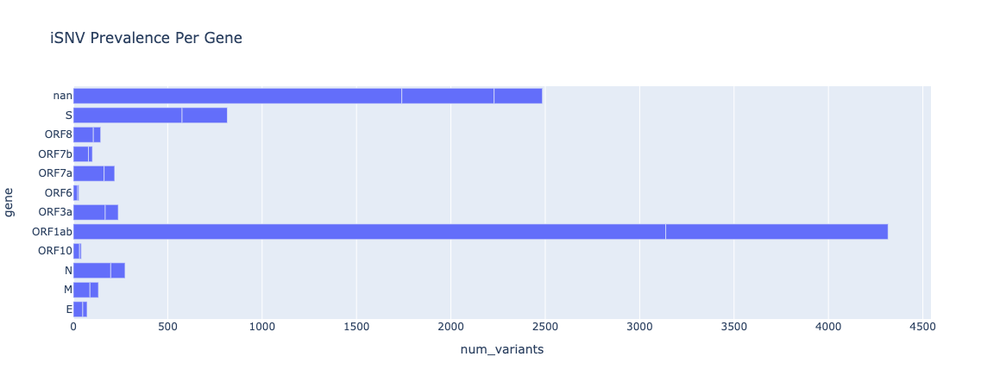

In [71]:
samples_per_gff = variants.groupby(['gene', 'iSNV Type']).agg(num_variants=('VAR', 'nunique')).reset_index()
fig = px.bar(samples_per_gff, y="gene", x="num_variants",
                 title="iSNV Prevalence Per Gene")
fig.show()

## TODO:
* replace `nan` gene based on `POS` 
* regenerate using heatmap with gene as y axis, iSNV type as x, and color as frequency

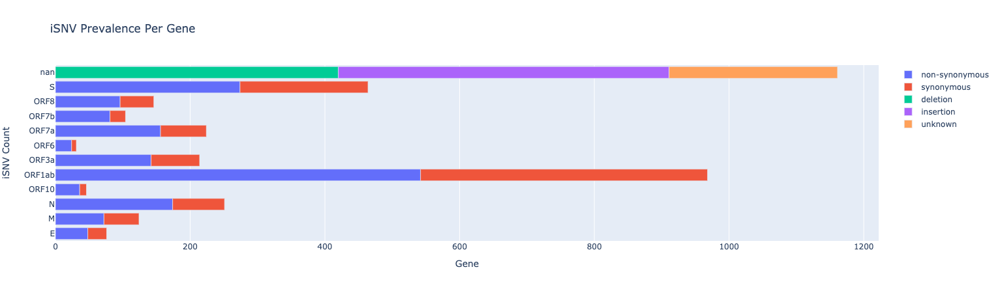

In [157]:
samples_per_gene = variants.groupby(['gene', 'iSNV Type']).agg(num_samples=('sample_id', 'nunique')).reset_index()
fig = go.Figure()
isnv_types = samples_per_gene['iSNV Type'].unique()
for isnv_t in isnv_types:
    data = samples_per_gene.loc[samples_per_gene['iSNV Type']==isnv_t]
    fig.add_trace(go.Bar(x=data['num_samples'], y=data['gene'], name=isnv_t, hovertext=isnv_t, orientation='h'))
fig.update_layout(barmode='relative', title_text='iSNV Prevalence Per Gene', yaxis_title='Gene', xaxis_title='iSNV Count')
fig.show()

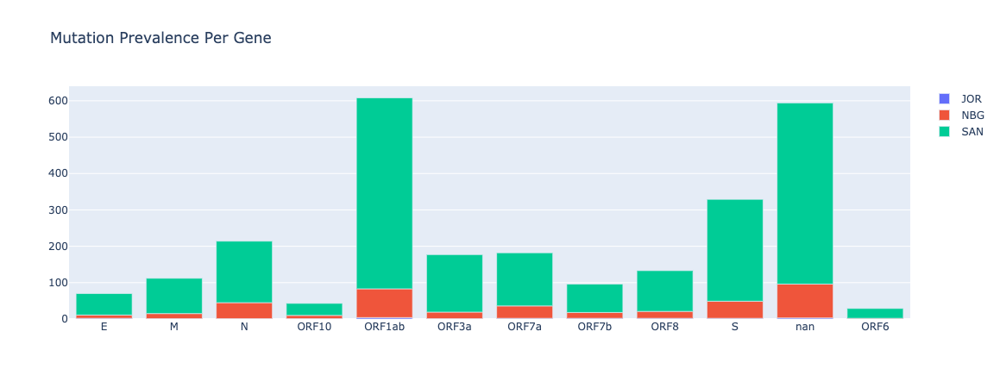

In [72]:
samples_per_gff = variants.groupby(['gene', 'location']).agg(num_samples=('sample_id', 'nunique')).reset_index()
fig = go.Figure()
locations = samples_per_gff['location'].unique()
for loc in locations:
    data = samples_per_gff.loc[samples_per_gff['location']==loc]
    fig.add_trace(go.Bar(y=data['num_samples'], x=data['gene'], name=loc, hovertext=loc))
fig.update_layout(barmode='relative', title_text='Mutation Prevalence Per Gene')
fig.show()

In [73]:
indel_vars = variants.loc[(variants['iSNV Type'].isin(['insertion', 'deletion'])) & (~variants['ALT'].isna())]
indel_vars['indel_len'] = indel_vars['ALT'].str.len() - 1
indel_vars[['ALT', 'indel_len']]

<ipython-input-73-f5c1c4ab10f4>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ALT,indel_len
51,-TT,2
52,-T,1
59,-GAACAATGGAACCTAGTAATAGGTTTCCTA,30
49,-TACTT,5
63,-A,1
...,...,...
10,-G,1
3,+T,1
6,-TTTTTGGGTG,10
61,-A,1


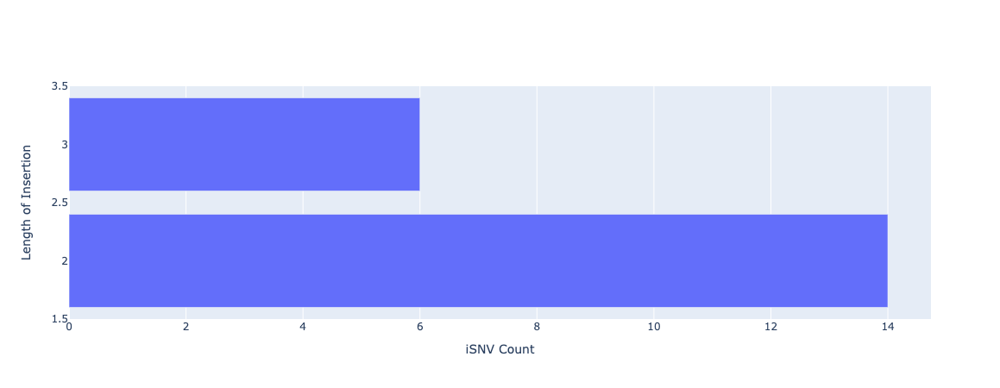

In [74]:
insert_vars = (indel_vars.loc[(indel_vars['iSNV Type']=='insertion') & (indel_vars['indel_len'] > 1)]
               .groupby('indel_len').size().reset_index().rename(columns={0: 'count'}))
fig = go.Figure(go.Bar(y=insert_vars['indel_len'], x=insert_vars['count'], orientation='h'))
fig.update_layout(barmode='relative', xaxis_title='iSNV Count', yaxis_title='Length of Insertion')
fig.show()

## TODO:
* regenerate using heatmap xaxis with gene, yaxis with indel length, and color is frequency

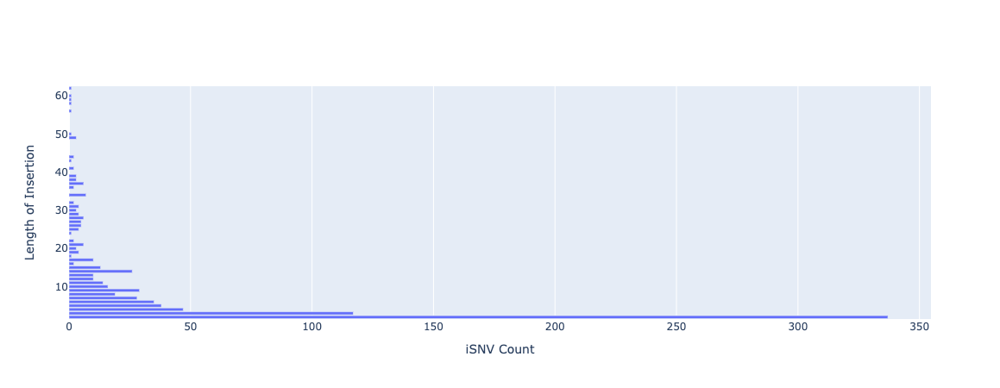

In [75]:
delete_vars = (indel_vars.loc[(indel_vars['iSNV Type']=='deletion') & (indel_vars['indel_len'] > 1)]
               .groupby('indel_len').size().reset_index().rename(columns={0: 'count'}))
fig = go.Figure(go.Bar(y=delete_vars['indel_len'], x=delete_vars['count'], orientation='h'))
fig.update_layout(barmode='relative', xaxis_title='iSNV Count', yaxis_title='Length of Insertion')
fig.show()

## TODO:
* compute entropy based on ALT value counts [done, to be reviewed]
* ignore any INDEL with one nucleotide insertion or deletion [done, to be reviewed]
* connect each GFF feature with corresponding gene [done, to be reviewed]
* annotate the variant count vs position with gene [TODO]
    * use `matplotlib` to do this? need to get comfortable with it
* for each gene, generate stacked bar chart annotated with synonymous or non-synonymous [done, to be reviewed]
* histogram of length of insertions and another of length of deletions [done, to be reviewed]

* explain PrimalSeq (amplicon-based) protocol first

* flowchart of the Snakemake pipeline
    * 

* iVar functionality
    * primer trimming
        * inputs
            * sorted BAM file with aligned reads
            * BED file with primers and their positions
        * parameters
            * minimum read length
            * minimum quality threshold
            * sliding window width
    * consensus generation
        * inputs
            * output from `samtools mpileup`
        * parameters
            * minimum quality score threshold
            * minimum frequency threshold
            * minimum depth 
        * outputs
            * fasta file with consensus sequences
            * text file with average quality of each base position
    * variant calling 
        * inputs
            * output from `samtools mpileup`
        * parameters
            * minimum quality score threshold
            * minimum frequency threshold
            * minimum depth 
        * outputs
            * TSV file with intra-host Single Nucleotide Variants (iSNVs)
    * describe the required paramaters for each functionality using schematic

* describe PrimalSeq protocol
    * show amplicon scheme, where primers are